### <font color ='green'>Курсовой проект по курсу "Python for Data Science"</font>

<h3>Постановка задачи</h3>

Требуется на основании демографических данных о клиентах банка, истории их платежей и состоянии счета, предсказать невыполнение их обязательств по кредитной карте в следующем месяце.

<h3>План курсового проекта</h3>

1.Загрузка данных, анализ, обработка выбросов

2.Выделение целевой переменной,оценка признаков

3.Модели машинного обучения

4.Выбор лучшей модели и подбор гиперпараметров

<h3>1. Загрузка данных, анализ, обработка выбросов</h3>

In [1]:
import numpy as np 
import pandas as pd 


In [2]:
PREP_DATASET_PATH = 'training_project_data_prep.csv'


In [3]:
train = pd.read_csv('course_project_train.csv')
test = pd.read_csv('course_project_test.csv')
submit = pd.DataFrame()


Описание датасета

Home Ownership - домовладение

Annual Income - годовой доход

Years in current job - количество лет на текущем месте работы

Tax Liens - налоговые обременения

Number of Open Accounts - количество открытых счетов

Years of Credit History - количество лет кредитной истории

Maximum Open Credit - наибольший открытый кредит

Number of Credit Problems - количество проблем с кредитом

Months since last delinquent - количество месяцев с последней просрочки платежа

Bankruptcies - банкротства

Purpose - цель кредита

Term - срок кредита

Current Loan Amount - текущая сумма кредита

Current Credit Balance - текущий кредитный баланс

Monthly Debt - ежемесячный долг

Credit Score - баллы кредитного рейтинга

Credit Default - факт невыполнения кредитных обязательств (0 - погашен вовремя, 1 - просрочка)

In [4]:
train.shape

(7500, 17)

In [5]:
train.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0


In [6]:
train.iloc[0]

Home Ownership                            Own Home
Annual Income                               482087
Years in current job                           NaN
Tax Liens                                        0
Number of Open Accounts                         11
Years of Credit History                       26.3
Maximum Open Credit                         685960
Number of Credit Problems                        1
Months since last delinquent                   NaN
Bankruptcies                                     1
Purpose                         debt consolidation
Term                                    Short Term
Current Loan Amount                          1e+08
Current Credit Balance                       47386
Monthly Debt                                  7914
Credit Score                                   749
Credit Default                                   0
Name: 0, dtype: object

In [7]:
train.describe()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
count,5.943000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.000000,3419.000000,7486.000000,7.500000e+03,7.500000e+03,7500.000000,5943.000000,7500.000000
mean,1.366392e+06,0.030133,11.130933,18.317467,9.451537e+05,0.170000,34.692600,0.117152,1.187318e+07,2.898332e+05,18314.454133,1151.087498,0.281733
std,8.453392e+05,0.271604,4.908924,7.041946,1.602622e+07,0.498598,21.688806,0.347192,3.192612e+07,3.178714e+05,11926.764673,1604.451418,0.449874
min,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.000000,0.000000,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000,0.000000
25%,8.443410e+05,0.000000,8.000000,13.500000,2.792295e+05,0.000000,16.000000,0.000000,1.801690e+05,1.142565e+05,10067.500000,711.000000,0.000000
50%,1.168386e+06,0.000000,10.000000,17.000000,4.781590e+05,0.000000,32.000000,0.000000,3.095730e+05,2.093230e+05,16076.500000,731.000000,0.000000
75%,1.640137e+06,0.000000,14.000000,21.800000,7.935015e+05,0.000000,50.000000,0.000000,5.198820e+05,3.604062e+05,23818.000000,743.000000,1.000000
max,1.014934e+07,7.000000,43.000000,57.700000,1.304726e+09,7.000000,118.000000,4.000000,1.000000e+08,6.506797e+06,136679.000000,7510.000000,1.000000


В большинстве колонок среднее значение превышает медиану, особенно сильно в Maximum Open Credit (в 2 раза). В Current Loan Amount наоборот медиана больше среднего более,чем в 2 раза. Скорей всего имеются выбросы.

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   object 
 1   Annual Income                 5943 non-null   float64
 2   Years in current job          7129 non-null   object 
 3   Tax Liens                     7500 non-null   float64
 4   Number of Open Accounts       7500 non-null   float64
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   float64
 8   Months since last delinquent  3419 non-null   float64
 9   Bankruptcies                  7486 non-null   float64
 10  Purpose                       7500 non-null   object 
 11  Term                          7500 non-null   object 
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

Пропуски в :  Annual Income,  Years in current job,  Tax Liens (привести к str), Months since last delinquent , Bankruptcies (привести к str) , Credit Score. 

In [9]:
for colname in['Home Ownership','Annual Income', 'Years in current job','Tax Liens','Number of Open Accounts','Years of Credit History','Maximum Open Credit', 'Number of Credit Problems', 'Months since last delinquent', 'Bankruptcies','Purpose', 'Term', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt', 'Credit Score', 'Credit Default']:
    print(train[colname].value_counts())

Home Mortgage    3637
Rent             3204
Own Home          647
Have Mortgage      12
Name: Home Ownership, dtype: int64
1161660.0    4
1058376.0    4
1338113.0    4
1043651.0    4
969475.0     4
            ..
1141254.0    1
7907382.0    1
1534478.0    1
972040.0     1
1654786.0    1
Name: Annual Income, Length: 5478, dtype: int64
10+ years    2332
2 years       705
3 years       620
< 1 year      563
5 years       516
1 year        504
4 years       469
6 years       426
7 years       396
8 years       339
9 years       259
Name: Years in current job, dtype: int64
0.0    7366
1.0      83
2.0      30
3.0      10
4.0       6
5.0       2
6.0       2
7.0       1
Name: Tax Liens, dtype: int64
9.0     728
11.0    692
10.0    677
8.0     638
7.0     613
12.0    562
6.0     504
13.0    465
14.0    420
5.0     325
15.0    313
16.0    265
17.0    232
4.0     212
18.0    143
19.0    139
3.0      95
20.0     93
21.0     78
23.0     59
24.0     50
22.0     49
25.0     32
2.0      28
28.0     14

In [10]:
train['Current Loan Amount'].mean()

11873177.445066666

Выбросы:

Number of Open Accounts значения > 30, 

значения  Years of Credit History > 20 лет 

Maximum Open Credit значение 0.0

Months since last delinquent  значения > 60 приравнять к 60 (больше 5 лет просрочки)

в Credit Score -значение 7010








Current Loan Amount должна быть больше или равна  Current Credit Balance. Monthly Debt не должен превышать Current Loan Amount.

In [11]:
train.dtypes

Home Ownership                   object
Annual Income                   float64
Years in current job             object
Tax Liens                       float64
Number of Open Accounts         float64
Years of Credit History         float64
Maximum Open Credit             float64
Number of Credit Problems       float64
Months since last delinquent    float64
Bankruptcies                    float64
Purpose                          object
Term                             object
Current Loan Amount             float64
Current Credit Balance          float64
Monthly Debt                    float64
Credit Score                    float64
Credit Default                    int64
dtype: object

Обработка пропусков

In [12]:
len(train) - train.count()

Home Ownership                     0
Annual Income                   1557
Years in current job             371
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent    4081
Bankruptcies                      14
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                    1557
Credit Default                     0
dtype: int64

In [13]:
train['Years in current job'].fillna('2 years', inplace = True)

In [14]:
train['Annual Income'].fillna(1.168386e+06, inplace = True)

In [15]:
train['Months since last delinquent'].fillna(34, inplace = True)

In [16]:
train['Credit Score'].fillna(730, inplace = True)

In [17]:
len(train) - train.count()

Home Ownership                   0
Annual Income                    0
Years in current job             0
Tax Liens                        0
Number of Open Accounts          0
Years of Credit History          0
Maximum Open Credit              0
Number of Credit Problems        0
Months since last delinquent     0
Bankruptcies                    14
Purpose                          0
Term                             0
Current Loan Amount              0
Current Credit Balance           0
Monthly Debt                     0
Credit Score                     0
Credit Default                   0
dtype: int64

Обработка выбросов

Number of Open Accounts


In [18]:
train.loc[train['Number of Open Accounts'] > 30, 'Number of Open Accounts'] = train['Number of Open Accounts'].mode()[0]

Years of Credit History

In [19]:
train.loc[train['Years of Credit History'] > 20, 'Years of Credit History'] = 20

Maximum Open Credit

In [20]:
train.loc[train['Maximum Open Credit'] == 0, 'Maximum Open Credit'] = train['Maximum Open Credit'].mode()[0]

Months since last delinquent

In [21]:
train.loc[train['Months since last delinquent'] > 50, 'Months since last delinquent'] = 50

Credit Score

In [22]:
train.loc[train['Credit Score'] > 30, 'Credit Score'] = train['Credit Score'].mode()[0]

Обзор целевой переменной

In [23]:
train['Credit Default'].value_counts()

0    5387
1    2113
Name: Credit Default, dtype: int64

Построение новых признаков

Id

In [24]:
train['ID'] = train.index.tolist()

Dummies

In [25]:
train['Home Ownership'].unique()

array(['Own Home', 'Home Mortgage', 'Rent', 'Have Mortgage'], dtype=object)

In [26]:
train['IS_HOME'] = train['Home Ownership'].map({'Own Home':1,'Home Mortgage':2, 'Rent':3,'Have Mortgage':4 }).astype(int)

In [27]:
train['Home Ownership'].value_counts()

Home Mortgage    3637
Rent             3204
Own Home          647
Have Mortgage      12
Name: Home Ownership, dtype: int64

In [28]:
train['Years in current job'].unique()

array(['2 years', '10+ years', '8 years', '6 years', '7 years', '5 years',
       '1 year', '< 1 year', '4 years', '3 years', '9 years'],
      dtype=object)

In [29]:
train['IS_YEAR'] = train['Years in current job'].map({'2 years':2, '10+ years':10, '8 years':8, '6 years':6, '7 years':7, '5 years':5, '1 year':1, '< 1 year':0, '4 years':4, '3 years':3, '9 years':9}).astype(int)

In [30]:
train['Years in current job'].value_counts()

10+ years    2332
2 years      1076
3 years       620
< 1 year      563
5 years       516
1 year        504
4 years       469
6 years       426
7 years       396
8 years       339
9 years       259
Name: Years in current job, dtype: int64

In [31]:
train['Purpose'].unique()

array(['debt consolidation', 'other', 'home improvements', 'take a trip',
       'buy a car', 'small business', 'business loan', 'wedding',
       'educational expenses', 'buy house', 'medical bills', 'moving',
       'major purchase', 'vacation', 'renewable energy'], dtype=object)

In [32]:
train['IS_PURPOSE'] = train['Purpose'].map({'debt consolidation':0, 'other':1, 'home improvements':2, 'take a trip':3, 'buy a car':4, 'small business':5, 'business loan':6, 'wedding':7,'educational expenses':8, 'buy house':9, 'medical bills':10, 'moving':11,'major purchase':12, 'vacation':13, 'renewable energy':14 }).astype(int)

In [33]:
train['Term'].unique()

array(['Short Term', 'Long Term'], dtype=object)

In [34]:
train['IS_TERM'] = train['Term'].map({'Short Term':1, 'Long Term':2}).astype(int)

In [35]:
for cat_colname in train.select_dtypes(include='object').columns[1:]:
    train = pd.concat([train, pd.get_dummies(train[cat_colname], prefix=cat_colname)], axis=1)

Сохранение обучающего датасета

In [36]:
train.to_csv(PREP_DATASET_PATH, index=False, encoding='utf-8')

<h3>2.Выделение целевой переменной,оценка признаков</h3>

In [37]:

from scipy.stats import shapiro
from scipy.stats import probplot
from scipy.stats import mannwhitneyu
from scipy.stats import chi2_contingency

import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [38]:
df = pd.read_csv(PREP_DATASET_PATH)


In [39]:
train = pd.read_csv('course_project_train.csv')
test = pd.read_csv('course_project_test.csv')


In [40]:
import warnings
warnings.simplefilter('ignore')

Выделение целевой переменной и групп признаков

In [41]:
TARGET_NAME = 'Credit Default'

In [42]:
BASE_FEATURE_NAMES = train.columns.drop(TARGET_NAME).tolist()

In [43]:
NEW_FEATURE_NAMES = df.columns.drop([TARGET_NAME] + BASE_FEATURE_NAMES).tolist()

In [44]:
NUM_FEATURE_NAMES = ['Annual Income', 'Number of Open Accounts', 'Years of Credit History', 'Maximum Open Credit', 'Number of Credit Problems', 'Months since last delinquent', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt', 'Credit Score']

In [45]:
CAT_FEATURE_NAMES = ['IS_HOME', 'IS_YEAR', 'IS_PURPOSE','Tax Liens', 'Bankruptcies', 'IS_TERM']

In [46]:
SELECTED_FEATURE_NAMES = NUM_FEATURE_NAMES + CAT_FEATURE_NAMES + NEW_FEATURE_NAMES

Корреляция с базовыми признаками

In [47]:
corr_with_target = df[BASE_FEATURE_NAMES + [TARGET_NAME]].corr().iloc[:-1, -1].sort_values(ascending=False)


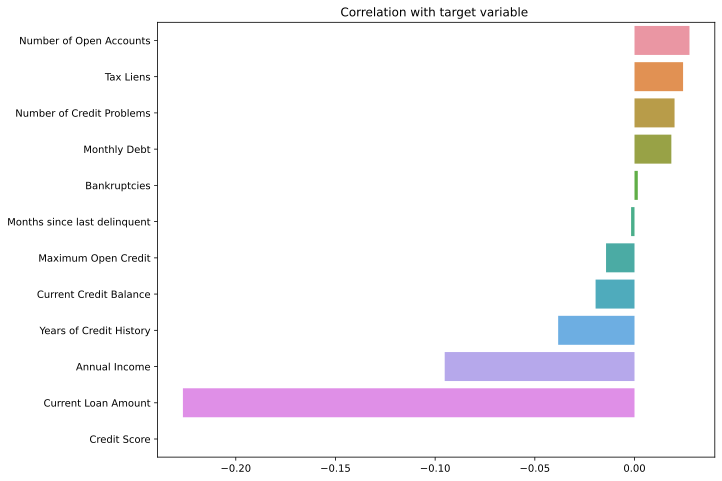

In [48]:
plt.figure(figsize=(10, 8))

sns.barplot(x=corr_with_target.values, y=corr_with_target.index)

plt.title('Correlation with target variable ')
plt.show()

Наибольшее влияние на целевую переменную имеют признаки  Current Loan Amount, Annual Income. Меньше всего  влиянияет Bankruptcies. 

Оценка признаков

Оценка признака Number of Credit Problems в разрезе целевой переменной

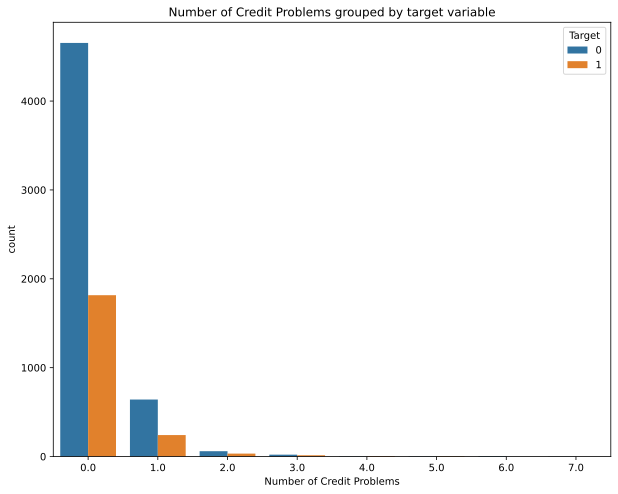

In [49]:
plt.figure(figsize=(10, 8))

sns.countplot(x="Number of Credit Problems", hue=TARGET_NAME, data=df)
plt.title('Number of Credit Problems grouped by target variable')
plt.legend(title='Target', loc='upper right')

plt.show()

Значения признака имеют большие отличия в разрезе целевой переменной.При отсутствии проблем с кредитом (значение 0), имеется максимальное  количество вовремя выполненных кредитных обязательств. При значении Number of Credit Problems равным 1, количество вовремя выплаченных платежей сокращается примерно в 3 раза. Соотношение значений целевой переменной примерно 60% на 40% (0 к 1 ).

Рассчитаем наблюдаемые частоты

In [50]:
df['Id'] = df.index

In [51]:
p1_and_target_s = df.loc[df['Number of Credit Problems'].isin([0, 1]), ['Id', 'Number of Credit Problems', 'Credit Default']]

In [52]:
table = p1_and_target_s.pivot_table(values='Id', index='Number of Credit Problems', columns='Credit Default', aggfunc='count')
table

Credit Default,0,1
Number of Credit Problems,,
0.0,4654,1815
1.0,641,241


Используем критерий Хи-квадрат Пирсона

In [53]:
chi2, p, _, _ = chi2_contingency(table)
p


0.6783214582441461

In [54]:
p1_and_target = df.loc[df['Number of Credit Problems'].isin([2, 3]), ['Id', 'Number of Credit Problems', 'Credit Default']]
table = p1_and_target.pivot_table(values='Id', index='Number of Credit Problems', columns='Credit Default', aggfunc='count')

chi2, p, _, _ = chi2_contingency(table)
p

0.789656113587645

P-value получилось больше выбранного уровня значимости, соответственно у нас нет оснований для отвержения нулевой гипотезы и можно допустить, что категории 2 и 3 одинаково влияют на целевую переменную и их можно объединить в одну категорию.

Оценка признака Number of Open Accounts в разрезе целевой переменной

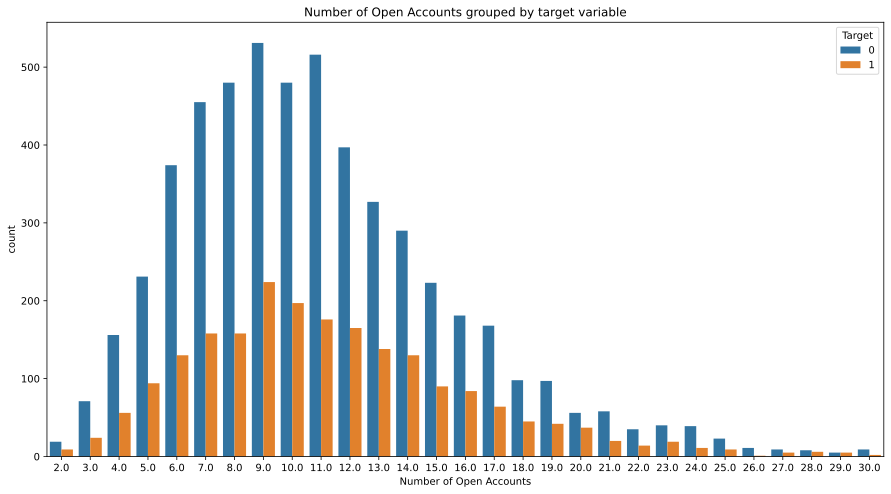

In [55]:
plt.figure(figsize=(15, 8))

sns.countplot(x="Number of Open Accounts", hue=TARGET_NAME, data=df)
plt.title('Number of Open Accounts grouped by target variable')
plt.legend(title='Target', loc='upper right')

plt.show()

Соотношение значений 0 целевой переменной больше,чем значений 1 на всем графике. Наибольшие количества счетчика целевой переменной при Number of Open Accounts 9 и 11.


Оценка признака Tax Liens в разрезе целевой переменной

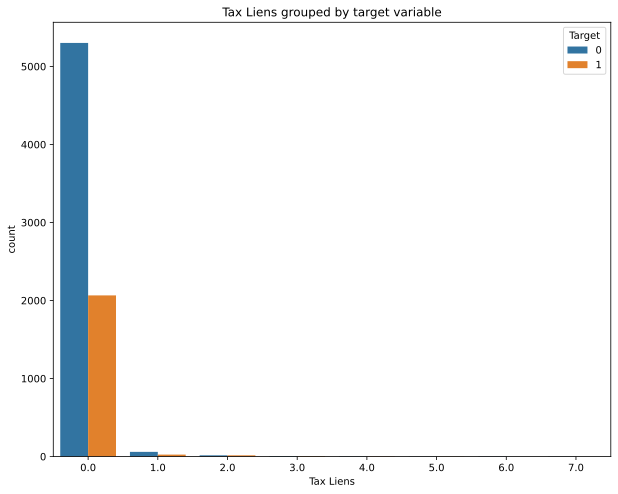

In [56]:
plt.figure(figsize=(10, 8))

sns.countplot(x="Tax Liens", hue=TARGET_NAME, data=df)
plt.title('Tax Liens grouped by target variable')
plt.legend(title='Target', loc='upper right')

plt.show()

Наибольшее влияние на целевую переменную имеет значение 0 Tax Liens, остальные выражены не значительно.

Оценка признака Current Loan Amount в разрезе целевой переменной

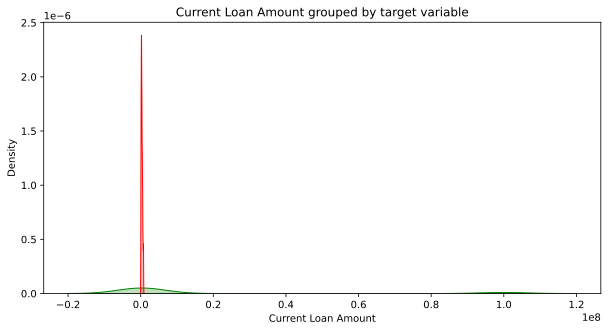

In [57]:
Current_Loan_Amount_with_target = df[['Current Loan Amount', TARGET_NAME]]
Current_Loan_Amount = Current_Loan_Amount_with_target['Current Loan Amount']
Current_Loan_Amount_target_0 = Current_Loan_Amount[Current_Loan_Amount_with_target[TARGET_NAME] == 0]
Current_Loan_Amount_target_1 = Current_Loan_Amount[Current_Loan_Amount_with_target[TARGET_NAME] == 1]

plt.figure(figsize=(10, 5))

sns.kdeplot(Current_Loan_Amount_target_0, shade=True, label='0', color='g')
sns.kdeplot(Current_Loan_Amount_target_1, shade=True, label='1', color='r')

plt.xlabel('Current Loan Amount')
plt.title('Current Loan Amount grouped by target variable')
plt.show()

Две группы имеют сильно отличающееся расположение, что говорит о функциональной зависимости и может помочь при построении модели.

Гипотеза 
* Нулевая гипотеза: средние значения в двух независимых выборках равны
* Альтернативная гипотеза: средние значения в двух независимых выборках различаются
* Критерий: критерий Стьюдента (t-тест) и его аналоги
* Уровень значимости $\normalsize \alpha$: 0.05
* Критическая область: двухсторонняя
Что бы проверить данную гипотезу сравним две выборки из рассматриваемых групп на предмет равенства средних значений.
Если вероятность того, что мат. ожидания в исходных группах равны, при данных выборках, будет менее 5%, то можно будет говорить о том, что скорее всего выборки имеют различные распределения.

In [58]:
shapiro(Current_Loan_Amount)

ShapiroResult(statistic=0.37670987844467163, pvalue=0.0)

По полученному значению p-value, которое сильно меньше 0.05, можем заключить, что гипотеза о "нормальности" отвергается.

 Произведём визуальную оценку распределения признака, а так же построим QQ-график

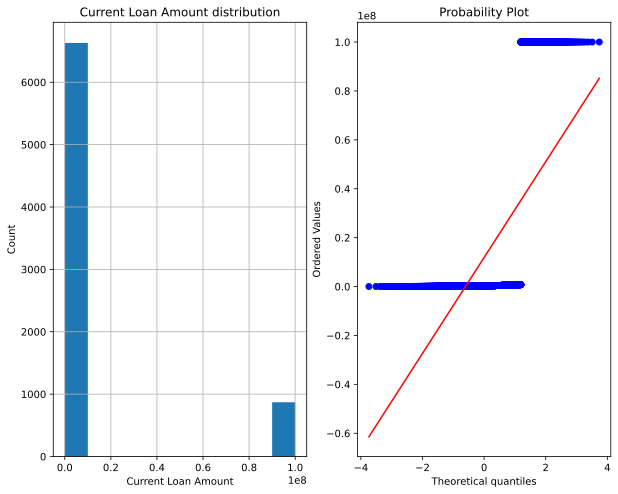

In [59]:
plt.figure(figsize=(10, 8))

ax1 = plt.subplot(121)
ax1.set_xlabel('Current Loan Amount')
ax1.set_ylabel('Count')
ax1.set_title('Current Loan Amount distribution')
Current_Loan_Amount.hist()

plt.subplot(122)
probplot(Current_Loan_Amount, dist='norm', plot=plt)

plt.show()

По графику видно,что существует точка, до которой y-квантили ниже x-квантилей, и после этой точки y-квантили выше, чем x-квантили. Распределение отличается от "нормального", в связи с чем, мы не сможем воспользоваться критерием Стьюдента для проверки гипотезы о равности мат. ожиданий признака Current Loan Amount в группах с ожиданием по выплате/невыплате кредита, но мы сможем воспользоваться его непараметрическим аналогом - критерием Манна-Уитни, который не требователен к закону распределения.

Оценим эквивалентность мат. ожадиний, в исследуемых группах, с помощью критерия Манна-Уитни

In [60]:
mannwhitneyu(Current_Loan_Amount_target_0,Current_Loan_Amount_target_1)

MannwhitneyuResult(statistic=5169258.0, pvalue=2.923443678733522e-10)

Для дополнительной проверки обратиться к доверительным интервалам

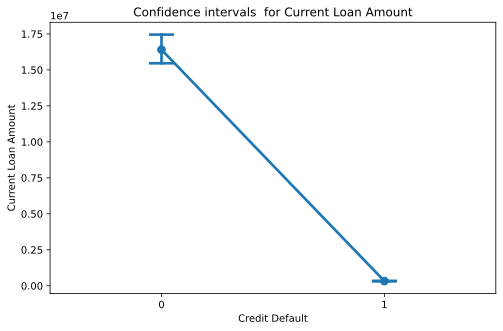

In [61]:
plt.figure(figsize=(8, 5))

sns.pointplot(x=TARGET_NAME, y='Current Loan Amount', data=Current_Loan_Amount_with_target, capsize=.1)

plt.title('Confidence intervals  for Current Loan Amount')
plt.show()

Вывод : по данному графику так  видно, что интервалы, в которых с 95% вероятностью должны находится истинные мат. ожидания этих двух групп, не пересекаются, что подтверждает результаты полученные с помощью критерия Манна-Уитни.

Это означает, что группы из которых взяты данные выборки, имеют различные распределения и этот признак может быть полезен для определения значения целевой переменной.

Оценка признака "Annual Income" в разрезе целевой переменной

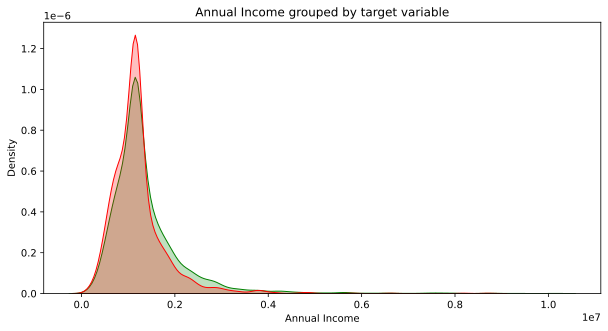

In [62]:
Annual_Income_with_target = df[['Annual Income', TARGET_NAME]]
Annual_Income = Annual_Income_with_target['Annual Income']
Annual_Income_target_0 = Annual_Income[Annual_Income_with_target[TARGET_NAME] == 0]
Annual_Income_target_1 = Annual_Income[Annual_Income_with_target[TARGET_NAME] == 1]

plt.figure(figsize=(10, 5))

sns.kdeplot(Annual_Income_target_0, shade=True, label='0', color='g')
sns.kdeplot(Annual_Income_target_1, shade=True, label='1', color='r')

plt.xlabel('Annual Income')
plt.title('Annual Income grouped by target variable')
plt.show()

Две группы, полученные в результате разбиения признака Annual Income по целевой переменной, имеют некоторые различия в распределении, это значит, что между признаком Annual Income и целевой переменной,существует некоторая функциональная зависимость.

In [63]:
shapiro(Annual_Income)

ShapiroResult(statistic=0.7313876152038574, pvalue=0.0)

Построим Q-Q график

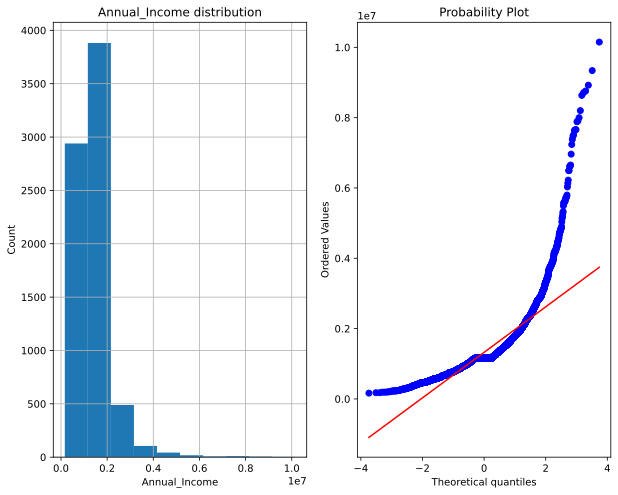

In [64]:
plt.figure(figsize=(10, 8))

ax1 = plt.subplot(121)
ax1.set_xlabel('Annual_Income')
ax1.set_ylabel('Count')
ax1.set_title('Annual_Income distribution')
Annual_Income.hist()

plt.subplot(122)
probplot(Annual_Income, dist='norm', plot=plt)

plt.show()

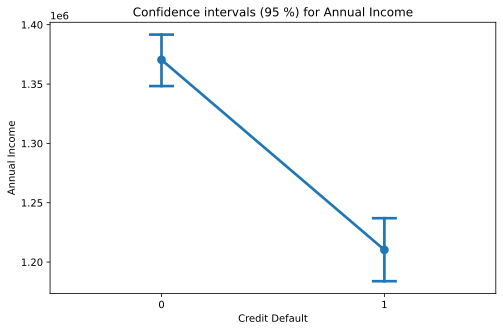

In [65]:
plt.figure(figsize=(8, 5))

sns.pointplot(x=TARGET_NAME, y='Annual Income', data=Annual_Income_with_target, capsize=.1)

plt.title('Confidence intervals (95 %) for Annual Income')
plt.show()

Благодаря полученным графикам,видно, что мы можем использовать признак Annual_Income для определения значения целевой переменной.

<h3>Анализ признакового пространства</h3>

Матрица корреляций

- Показывает линейную связь между переменными
- Изменяется от -1 до 1
- Корреляция - мера только __линейной__ связи

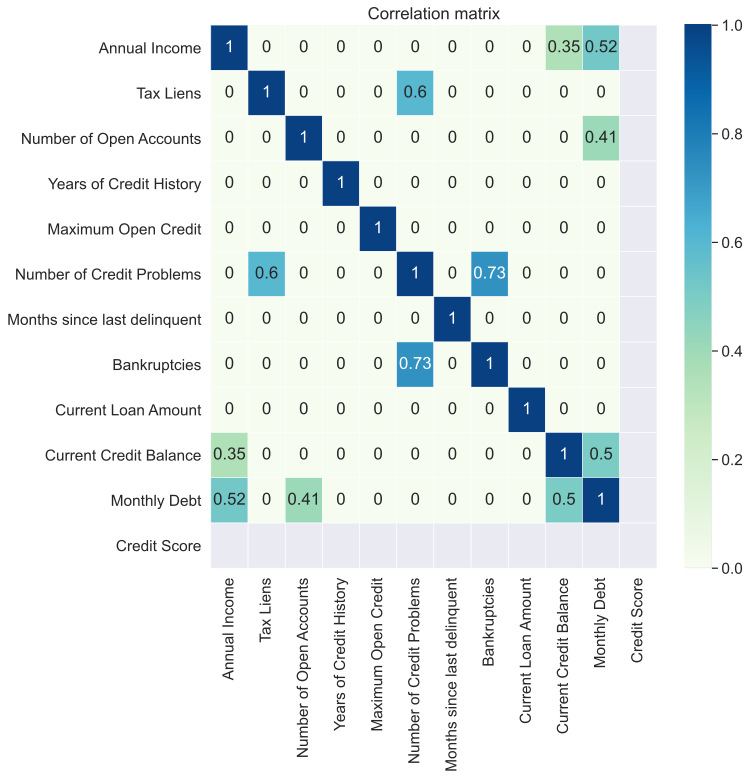

In [66]:
plt.figure(figsize = (10,10))

sns.set(font_scale=1.4)

corr_matrix = df[BASE_FEATURE_NAMES].corr()
corr_matrix = np.round(corr_matrix, 2)
corr_matrix[np.abs(corr_matrix) < 0.3] = 0

sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap='GnBu')

plt.title('Correlation matrix')
plt.show()

In [67]:
from sklearn.metrics import mutual_info_score

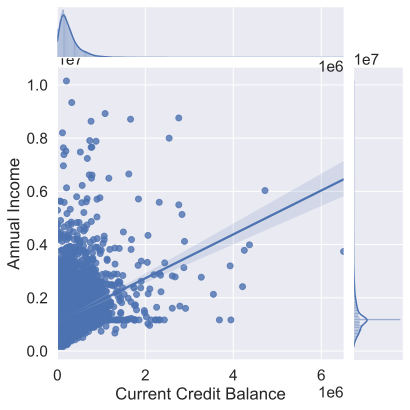

In [68]:
sns.jointplot(df['Current Credit Balance'], df['Annual Income'], kind='reg');

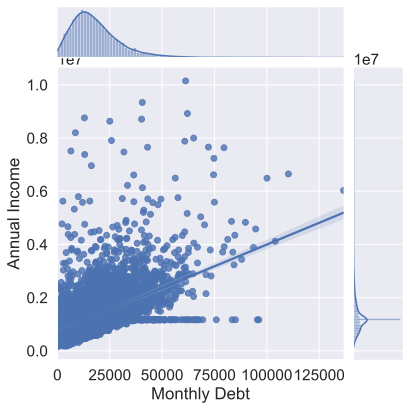

In [69]:
sns.jointplot(df['Monthly Debt'], df['Annual Income'], kind='reg');

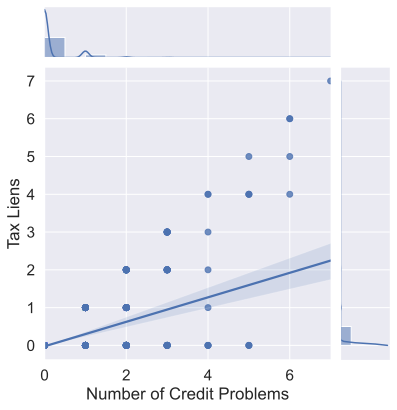

In [70]:
sns.jointplot(df['Number of Credit Problems'], df['Tax Liens'], kind='reg');

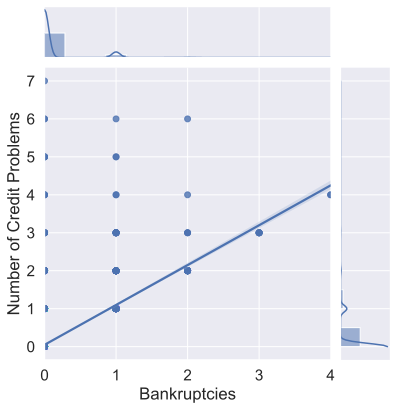

In [71]:
sns.jointplot(df['Bankruptcies'], df['Number of Credit Problems'], kind='reg');

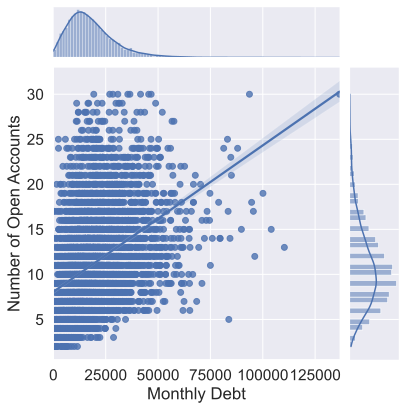

In [72]:
sns.jointplot(df['Monthly Debt'], df['Number of Open Accounts'], kind='reg');

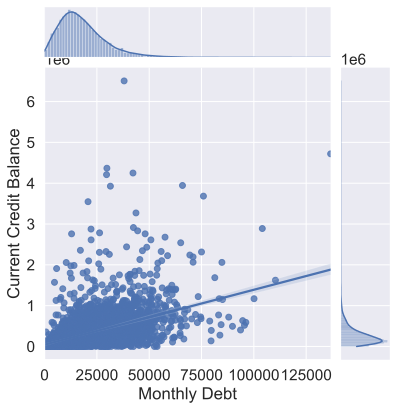

In [73]:
sns.jointplot(df['Monthly Debt'], df['Current Credit Balance'], kind='reg');

<h3>3.Модели машинного обучения</h3>

In [74]:

import random
from pathlib import Path

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score, learning_curve
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb, lightgbm as lgbm, catboost as catb


import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline


In [75]:
import warnings
warnings.filterwarnings('ignore')

In [76]:
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    print('TRAIN\n\n' + classification_report(y_train_true, y_train_pred))
    print('TEST\n\n' + classification_report(y_test_true, y_test_pred))
    print('CONFUSION MATRIX\n')
    print(pd.crosstab(y_test_true, y_test_pred))

In [77]:
def evaluate_preds(model, X_train, X_test, y_train, y_test):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

In [78]:
def balance_df_by_target(df, target_name, method='over'):

    assert method in ['over', 'under', 'tomek', 'smote'], 'Неверный метод сэмплирования'
    
    target_counts = df[target_name].value_counts()

    major_class_name = target_counts.argmax()
    minor_class_name = target_counts.argmin()

    disbalance_coeff = int(target_counts[major_class_name] / target_counts[minor_class_name]) - 1
    if method == 'over':
        for i in range(disbalance_coeff):
            sample = df[df[target_name] == minor_class_name].sample(target_counts[minor_class_name])
            df = df.append(sample, ignore_index=True)
            
    elif method == 'under':
        df_ = df.copy()
        df = df_[df_[target_name] == minor_class_name]
        tmp = df_[df_[target_name] == major_class_name]
        df = df.append(tmp.iloc[
            np.random.randint(0, tmp.shape[0], target_counts[minor_class_name])
        ], ignore_index=True)

    elif method == 'tomek':
        from imblearn.under_sampling import TomekLinks
        tl = TomekLinks()
        X_tomek, y_tomek = tl.fit_sample(df.drop(columns=target_name), df[target_name])
        df = pd.concat([X_tomek, y_tomek], axis=1)
    
    elif method == 'smote':
        from imblearn.over_sampling import SMOTE
        smote = SMOTE()
        X_smote, y_smote = smote.fit_sample(df.drop(columns=target_name), df[target_name])
        df = pd.concat([X_smote, y_smote], axis=1)

    return df.sample(frac=1) 

Масштабрование данных

In [79]:
scaler = StandardScaler()

df_norm = df.copy()
df_norm[NUM_FEATURE_NAMES] = scaler.fit_transform(df_norm[NUM_FEATURE_NAMES])

df = df_norm.copy()

In [80]:
SCALER_FILE_PATH =  'scaler.pkl'


In [81]:

import pickle

In [82]:
with open(SCALER_FILE_PATH, 'wb') as file:
    pickle.dump(scaler, file)

In [83]:
len(df) - df.count()

Home Ownership                     0
Annual Income                      0
Years in current job               0
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent       0
Bankruptcies                      14
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                       0
Credit Default                     0
ID                                 0
IS_HOME                            0
IS_YEAR                            0
IS_PURPOSE                         0
IS_TERM                            0
Years in current job_1 year        0
Years in current job_10+ years     0
Years in current job_2 years       0
Years in current job_3 years       0
Years in current job_4 years       0
Y

In [84]:
df['Bankruptcies'].fillna(0, inplace = True)

Разбиение на train и test

In [85]:
X = df[SELECTED_FEATURE_NAMES]
y = df[TARGET_NAME]

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    shuffle=True,
                                                    test_size=0.3,
                                                    random_state=21,
                                                    stratify=y)

display(y_train.value_counts(normalize=True), y_test.value_counts(normalize=True))

0    0.718286
1    0.281714
Name: Credit Default, dtype: float64

0    0.718222
1    0.281778
Name: Credit Default, dtype: float64

In [86]:
train = pd.concat([X_train, y_train], axis=1)
test = pd.concat([X_test, y_test], axis=1)

In [87]:
df['Bankruptcies'].fillna(0, inplace = True)

Linear Regression 

In [88]:
model_lr = LogisticRegression()
model_lr.fit(X_train, y_train)

evaluate_preds(model_lr, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.75      0.92      0.83      3771
           1       0.53      0.22      0.31      1479

    accuracy                           0.73      5250
   macro avg       0.64      0.57      0.57      5250
weighted avg       0.69      0.73      0.68      5250

TEST

              precision    recall  f1-score   support

           0       0.74      0.91      0.82      1616
           1       0.45      0.19      0.27       634

    accuracy                           0.71      2250
   macro avg       0.60      0.55      0.54      2250
weighted avg       0.66      0.71      0.66      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1467  149
1                511  123


k ближайших соседей

In [89]:
model_knn = KNeighborsClassifier()
model_knn.fit(X_train, y_train)

evaluate_preds(model_knn, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.78      0.93      0.85      3771
           1       0.65      0.31      0.42      1479

    accuracy                           0.76      5250
   macro avg       0.71      0.62      0.63      5250
weighted avg       0.74      0.76      0.73      5250

TEST

              precision    recall  f1-score   support

           0       0.72      0.86      0.78      1616
           1       0.30      0.15      0.20       634

    accuracy                           0.66      2250
   macro avg       0.51      0.51      0.49      2250
weighted avg       0.60      0.66      0.62      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1391  225
1                538   96


Дерево решений

In [90]:
model_tree = DecisionTreeClassifier(random_state=21,
                                    class_weight={0:1, 1:3.6},
                                    max_depth=4
                                    )
model_tree.fit(X_train, y_train)

evaluate_preds(model_tree, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.90      0.32      0.48      3771
           1       0.35      0.91      0.50      1479

    accuracy                           0.49      5250
   macro avg       0.62      0.62      0.49      5250
weighted avg       0.75      0.49      0.48      5250

TEST

              precision    recall  f1-score   support

           0       0.89      0.31      0.46      1616
           1       0.34      0.90      0.49       634

    accuracy                           0.48      2250
   macro avg       0.62      0.61      0.48      2250
weighted avg       0.74      0.48      0.47      2250

CONFUSION MATRIX

col_0             0     1
Credit Default           
0               500  1116
1                61   573


Подготовка для catboost

In [91]:
df.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,...,Purpose_moving,Purpose_other,Purpose_renewable energy,Purpose_small business,Purpose_take a trip,Purpose_vacation,Purpose_wedding,Term_Long Term,Term_Short Term,Id
0,Own Home,-1.114304,2 years,0.0,-0.008719,0.979307,-0.016174,1.664779,0.129458,1.0,...,0,0,0,0,0,0,0,0,1,0
1,Own Home,-0.396190,10+ years,0.0,0.840536,-0.247066,0.014763,-0.340979,0.129458,0.0,...,0,0,0,0,0,0,0,1,0,1
2,Home Mortgage,-0.758385,8 years,0.0,-0.008719,0.979307,0.014807,-0.340979,0.129458,0.0,...,0,0,0,0,0,0,0,0,1,2
3,Own Home,-0.687478,6 years,0.0,-0.645661,0.979307,-0.049781,1.664779,0.129458,1.0,...,0,0,0,0,0,0,0,0,1,3
4,Rent,-0.725543,8 years,0.0,0.415909,-0.690648,-0.034902,1.664779,0.129458,0.0,...,0,0,0,0,0,0,0,0,1,4


In [92]:
BASE_FEATURE_NAMES

['Home Ownership',
 'Annual Income',
 'Years in current job',
 'Tax Liens',
 'Number of Open Accounts',
 'Years of Credit History',
 'Maximum Open Credit',
 'Number of Credit Problems',
 'Months since last delinquent',
 'Bankruptcies',
 'Purpose',
 'Term',
 'Current Loan Amount',
 'Current Credit Balance',
 'Monthly Debt',
 'Credit Score']

In [93]:
df.dtypes

Home Ownership                     object
Annual Income                     float64
Years in current job               object
Tax Liens                         float64
Number of Open Accounts           float64
Years of Credit History           float64
Maximum Open Credit               float64
Number of Credit Problems         float64
Months since last delinquent      float64
Bankruptcies                      float64
Purpose                            object
Term                               object
Current Loan Amount               float64
Current Credit Balance            float64
Monthly Debt                      float64
Credit Score                      float64
Credit Default                      int64
ID                                  int64
IS_HOME                             int64
IS_YEAR                             int64
IS_PURPOSE                          int64
IS_TERM                             int64
Years in current job_1 year         int64
Years in current job_10+ years    

In [94]:
X = df[BASE_FEATURE_NAMES]
y = df[TARGET_NAME]

CAT_FEATURE_NAMES = ['Home Ownership', 'Purpose', 'Term', 'Years in current job']

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    shuffle=True,
                                                    test_size=0.3,
                                                    random_state=21,
                                                    stratify=y)

In [95]:
model_catb = catb.CatBoostClassifier(silent=True, random_state=21,
                                     cat_features=CAT_FEATURE_NAMES,
#                                      one_hot_max_size=10
                                     )
model_catb.fit(X_train, y_train)

evaluate_preds(model_catb, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.81      0.98      0.89      3771
           1       0.89      0.42      0.57      1479

    accuracy                           0.82      5250
   macro avg       0.85      0.70      0.73      5250
weighted avg       0.83      0.82      0.80      5250

TEST

              precision    recall  f1-score   support

           0       0.75      0.93      0.83      1616
           1       0.51      0.19      0.28       634

    accuracy                           0.72      2250
   macro avg       0.63      0.56      0.55      2250
weighted avg       0.68      0.72      0.67      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1500  116
1                512  122


In [96]:
disbalance = y_train.value_counts()[0] / y_train.value_counts()[1]
disbalance

2.5496957403651117

In [97]:
model_catb = catb.CatBoostClassifier(silent=True, random_state=21,
                                     cat_features=CAT_FEATURE_NAMES,
                                     class_weights=[1, disbalance]
                                     )
model_catb.fit(X_train, y_train)

evaluate_preds(model_catb, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.94      0.78      0.85      3771
           1       0.61      0.86      0.71      1479

    accuracy                           0.80      5250
   macro avg       0.77      0.82      0.78      5250
weighted avg       0.84      0.80      0.81      5250

TEST

              precision    recall  f1-score   support

           0       0.80      0.66      0.73      1616
           1       0.41      0.59      0.48       634

    accuracy                           0.64      2250
   macro avg       0.60      0.63      0.60      2250
weighted avg       0.69      0.64      0.66      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1067  549
1                260  374


In [98]:
model_catb = catb.CatBoostClassifier(silent=True, random_state=21,
                                     class_weights=[1, disbalance],
                                     eval_metric='F1',
                                     cat_features=CAT_FEATURE_NAMES,
                                     early_stopping_rounds=24,
                                     use_best_model=True,
                                     custom_metric=['Precision', 'Recall']
                                    )
model_catb.fit(X_train, y_train, plot=True, eval_set=(X_test, y_test))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [99]:
model_catb.best_score_

{'learn': {'Recall:use_weights=false': 0.716024340770791,
  'Logloss': 0.5963574274943784,
  'F1': 0.68791944786552,
  'Precision:use_weights=false': 0.43437243642329776,
  'Precision:use_weights=true': 0.6619375329846835,
  'Recall:use_weights=true': 0.716024340770791},
 'validation': {'Recall:use_weights=false': 0.6545741324921136,
  'Logloss': 0.6162952054000062,
  'F1': 0.6378791282878515,
  'Precision:use_weights=false': 0.3978599221789883,
  'Precision:use_weights=true': 0.6275180637111122,
  'Recall:use_weights=true': 0.6545741324921136}}

In [100]:
evaluate_preds(model_catb, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.83      0.62      0.71      3771
           1       0.42      0.69      0.52      1479

    accuracy                           0.64      5250
   macro avg       0.63      0.65      0.62      5250
weighted avg       0.72      0.64      0.66      5250

TEST

              precision    recall  f1-score   support

           0       0.82      0.60      0.69      1616
           1       0.39      0.65      0.49       634

    accuracy                           0.62      2250
   macro avg       0.60      0.63      0.59      2250
weighted avg       0.70      0.62      0.64      2250

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               973  643
1               219  415


<h3> 4.Выбор лучшей модели и подбор гиперпараметров</h3> 

In [101]:
frozen_params = {
     'class_weights':[1, disbalance], 
     'silent':True,
     'random_state':21,
     'cat_features':CAT_FEATURE_NAMES,
     'eval_metric':'F1',
     'early_stopping_rounds':24
}
model_catb = catb.CatBoostClassifier(**frozen_params)

In [102]:
params = {'iterations':[50, 200, 500, 700, 1500],
          'max_depth':[3, 5, 7]}

In [103]:
cv = StratifiedKFold(n_splits=3, random_state=21, shuffle=True)

In [104]:
grid_search = model_catb.grid_search(params, X_train, y_train, cv=cv, stratified=True, plot=True, refit=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 0.5836001328
bestIteration = 49

0:	loss: 0.5836001	best: 0.5836001 (0)	total: 601ms	remaining: 8.41s
Stopped by overfitting detector  (24 iterations wait)

bestTest = 0.6328451596
bestIteration = 113

1:	loss: 0.6328452	best: 0.6328452 (1)	total: 2.25s	remaining: 14.6s
Stopped by overfitting detector  (24 iterations wait)

bestTest = 0.6328451596
bestIteration = 113

2:	loss: 0.6328452	best: 0.6328452 (1)	total: 3.43s	remaining: 13.7s
Stopped by overfitting detector  (24 iterations wait)

bestTest = 0.6328451596
bestIteration = 113

3:	loss: 0.6328452	best: 0.6328452 (1)	total: 4.61s	remaining: 12.7s
Stopped by overfitting detector  (24 iterations wait)

bestTest = 0.6328451596
bestIteration = 113

4:	loss: 0.6328452	best: 0.6328452 (1)	total: 5.79s	remaining: 11.6s
Stopped by overfitting detector  (24 iterations wait)

bestTest = 0.6149570427
bestIteration = 10

5:	loss: 0.6149570	best: 0.6328452 (1)	total: 6.21s	remaining: 9.32s
Stopped by overfitting detector  (24 itera

In [105]:
grid_search

{'params': {'depth': 3, 'iterations': 200},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
       

In [106]:
pd.DataFrame(grid_search['cv_results']).sort_values('test-F1-mean', ascending=False).head()

,iterations,test-F1-mean,test-F1-std,train-F1-mean,train-F1-std,test-Logloss-mean,test-Logloss-std,train-Logloss-mean,train-Logloss-std
98,98,0.655137,0.015517,0.680191,0.012224,0.617192,0.004228,0.605895,0.001707
97,97,0.654490,0.014760,0.680522,0.012074,0.617179,0.004102,0.606068,0.001645
99,99,0.654116,0.015536,0.680315,0.012398,0.617149,0.004227,0.605787,0.001692
96,96,0.654098,0.013782,0.681556,0.013592,0.617254,0.004152,0.606207,0.001608
81,81,0.654084,0.019421,0.682481,0.017294,0.618578,0.004885,0.608858,0.000898


**Обучение и оценка финальной модели**

In [107]:
%%time

final_model = catb.CatBoostClassifier(**frozen_params, iterations=20, max_depth=7)
final_model.fit(X_train, y_train, plot=True, eval_set=(X_test, y_test))

evaluate_preds(final_model, X_train, X_test, y_train, y_test)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.59      0.69      3771
           1       0.40      0.71      0.51      1479

    accuracy                           0.62      5250
   macro avg       0.62      0.65      0.60      5250
weighted avg       0.71      0.62      0.64      5250

TEST

              precision    recall  f1-score   support

           0       0.82      0.58      0.68      1616
           1       0.39      0.67      0.49       634

    accuracy                           0.61      2250
   macro avg       0.60      0.63      0.59      2250
weighted avg       0.70      0.61      0.63      2250

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               943  673
1               208  426
Wall time: 861 ms


In [108]:
pred_train = model_catb.predict(X_train)
pred_test =model_catb.predict(X_test)

evaluate_preds(model_catb, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.88      0.67      0.76      3771
           1       0.48      0.78      0.59      1479

    accuracy                           0.70      5250
   macro avg       0.68      0.72      0.68      5250
weighted avg       0.77      0.70      0.71      5250

TEST

              precision    recall  f1-score   support

           0       0.81      0.61      0.70      1616
           1       0.39      0.64      0.49       634

    accuracy                           0.62      2250
   macro avg       0.60      0.63      0.59      2250
weighted avg       0.69      0.62      0.64      2250

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               988  628
1               227  407


In [109]:
pred_test

array([0, 1, 1, ..., 0, 0, 0], dtype=int64)

In [110]:
submit['Credit Default'] = pred_test

In [111]:

submit.head()

,Credit Default
0,0
1,1
2,1
3,0
4,0


In [113]:
submit.to_csv('Evdokimova_predictions.csv', index=False, sep=',')